<div style="background-color:#5D73F2; color:#19180F; font-size:40px; font-family:Arial; padding:10px; border: 5px solid #19180F; border-radius:10px"> LazyPredict </div>



<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Importing modules
    </div>

In [1]:
!pip install lazypredict --quiet

In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from lazypredict.Supervised import LazyClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import optuna
import lightgbm as lib
from sklearn.metrics import log_loss

<div style="background-color:#D5D9F2; color:#19180F; font-size:15px; font-family:Arial; padding:10px; border: 5px solid #19180F; border-radius:10px"> 1. Data Preprocessing </div>

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Loading the data    </div>

In [3]:
train_df = pd.read_csv('/kaggle/input/playground-series-s3e26/train.csv')
test_df = pd.read_csv('/kaggle/input/playground-series-s3e26/test.csv')

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Encoding target variable    </div>

In [4]:
label_encoder = LabelEncoder()
train_df['Status'] = label_encoder.fit_transform(train_df['Status'])


<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Splitting the data into features and target    </div>

In [5]:
X = train_df.drop(['id', 'Status'], axis=1)
y = train_df['Status']
X = pd.get_dummies(X, columns=['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema'])
test_df = pd.get_dummies(test_df, columns=['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema'])

<div style="background-color:#D5D9F2; color:#19180F; font-size:15px; font-family:Arial; padding:10px; border: 5px solid #19180F; border-radius:10px"> 2. Exploratory Data Analysis </div>

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Excluding non numeric columns from correlation matrix calculation and visualizing correlation matrix    </div>

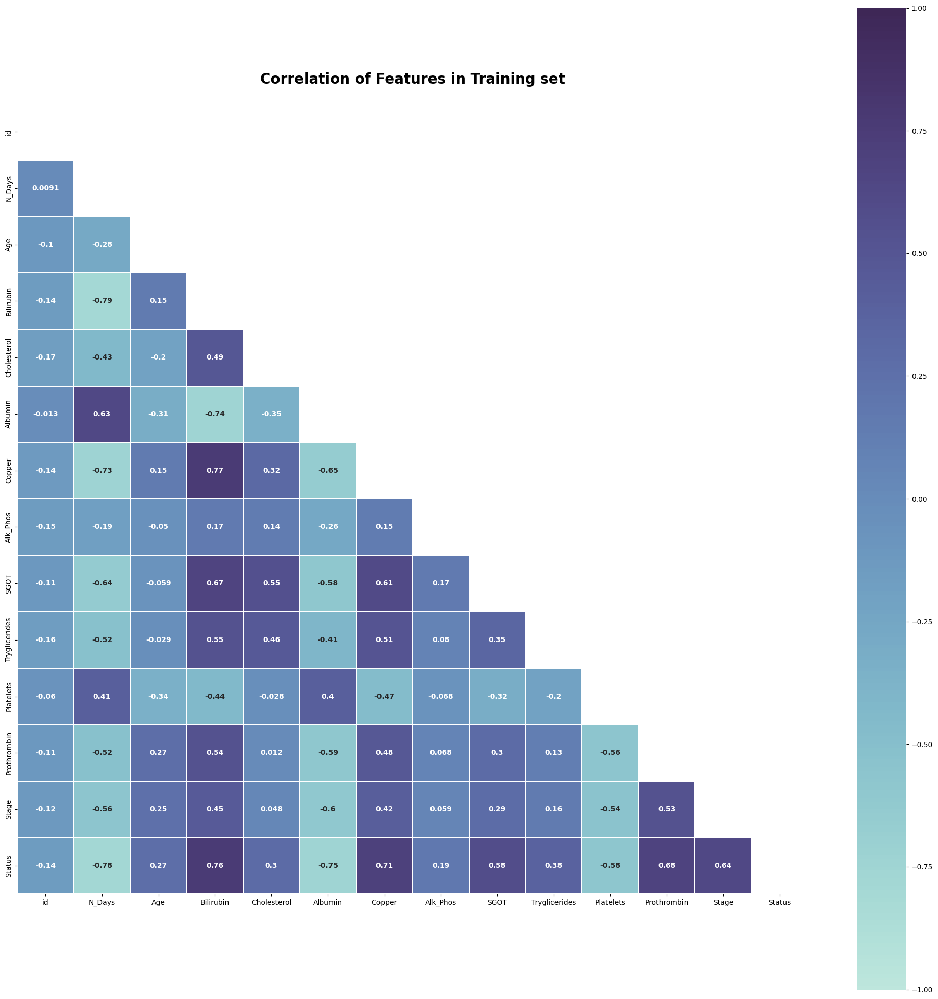

In [6]:
numeric_columns = train_df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = train_df[numeric_columns].corr()

#customized correlation matrix plotting function

def plot_heatmap(df, title):
    mask = np.triu(np.ones_like(df.corr()))
    
    colormap = sns.cubehelix_palette(n_colors=15, start=.46, rot=-.45, dark=.2, hue=0.95, as_cmap=True)
    
    plt.figure(figsize=(25, 25))
    
    plt.title(f'Correlation of Features in {title}', fontweight='bold', y=1.02, size=20)
    
    sns.heatmap(df.corr(), linewidths=0.1, vmax=1.0, vmin=-1.0,
                square=True, cmap=colormap, linecolor='white', annot=True, annot_kws={"size": 10, "weight": "bold"},
                mask=mask)
    
plot_heatmap(correlation_matrix, 'Training set')
plt.show()


<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Plotting box plot    </div>

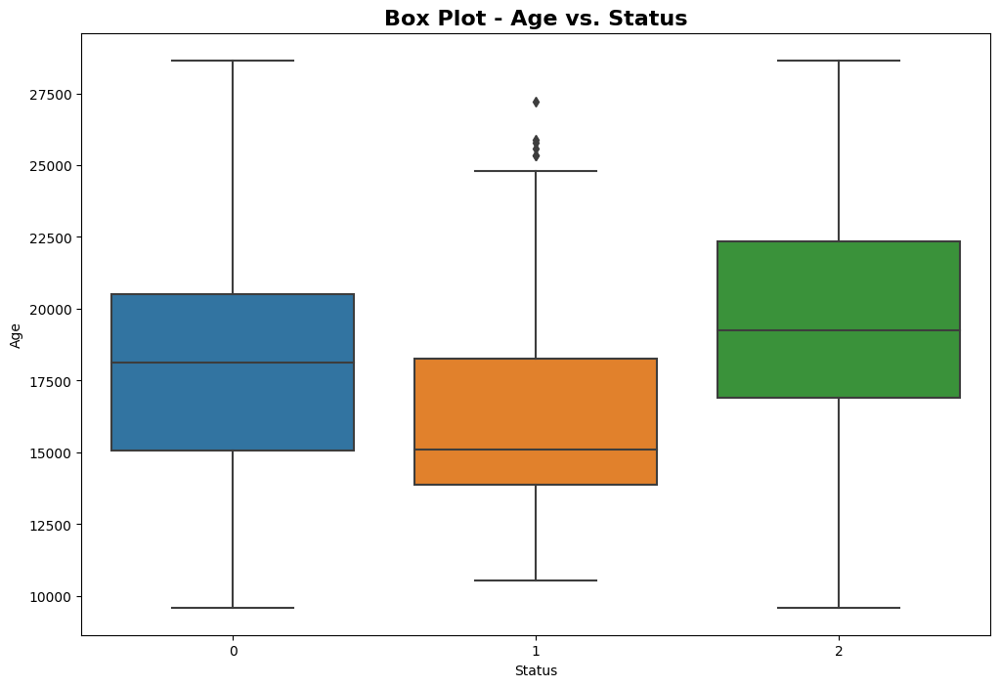

In [7]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='Status', y='Age', data=train_df)
plt.title('Box Plot - Age vs. Status', fontweight='bold', size=16)
plt.show()


<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Plotting pair plot    </div>

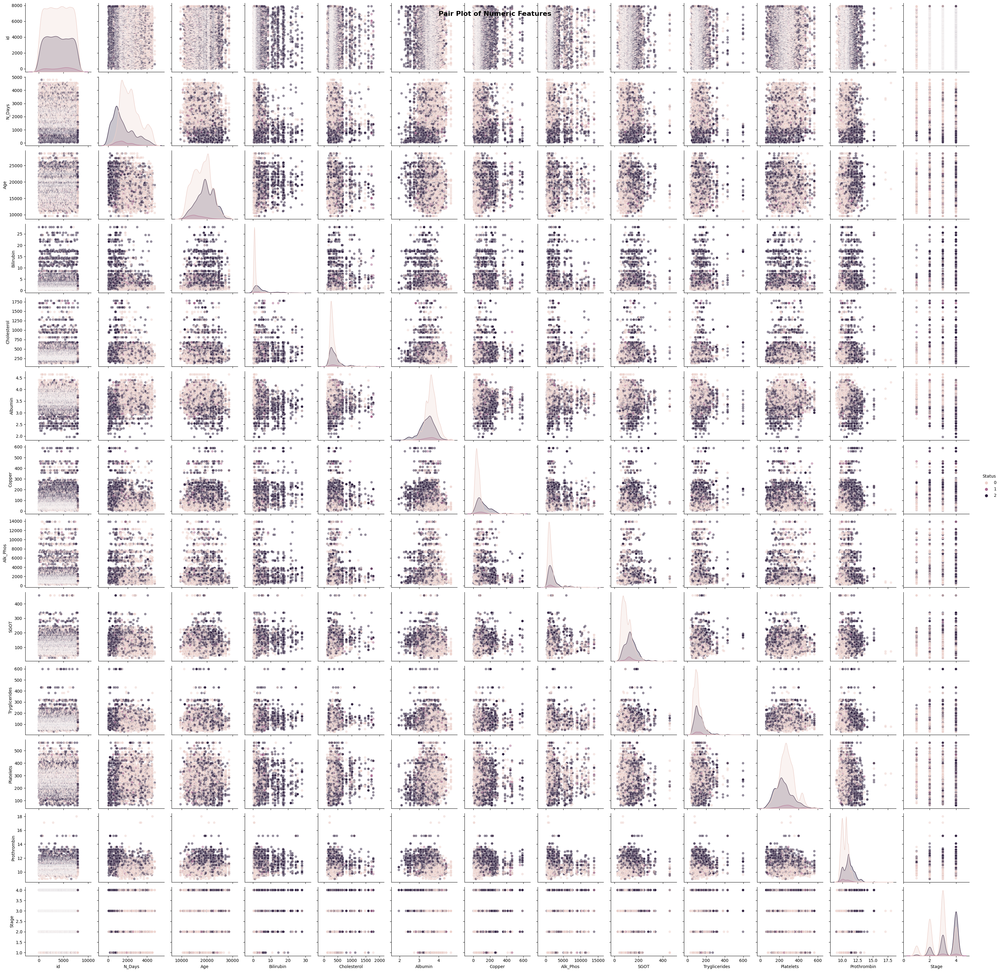

In [8]:
sns.pairplot(train_df[numeric_columns], hue='Status', plot_kws={'alpha': 0.5})
plt.suptitle('Pair Plot of Numeric Features', fontweight='bold', size=16)
plt.show()

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Plotting hist plot    </div>

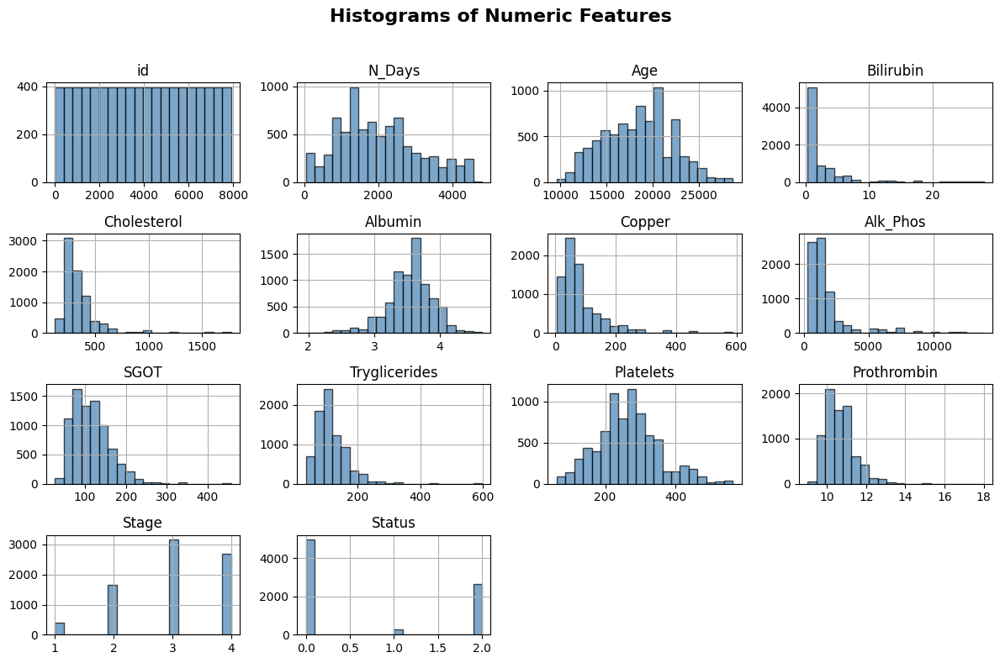

In [9]:
train_df[numeric_columns].hist(figsize=(12, 8), bins=20, color='steelblue', edgecolor='black', alpha=0.7)
plt.suptitle('Histograms of Numeric Features', fontweight='bold', size=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

<div style="background-color:#D5D9F2; color:#19180F; font-size:15px; font-family:Arial; padding:10px; border: 5px solid #19180F; border-radius:10px"> 3. Model Selection
</div>

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Fitting lazy classifier to find the best model    </div>

In [10]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

clf = LazyClassifier(predictions=True)
models, predictions = clf.fit(X_train, X_val, y_train, y_val)

print(models)

100%|██████████| 29/29 [00:23<00:00,  1.21it/s]

                               Accuracy  Balanced Accuracy ROC AUC  F1 Score  \
Model                                                                          
LGBMClassifier                     0.83               0.62    None      0.83   
XGBClassifier                      0.83               0.62    None      0.82   
NearestCentroid                    0.71               0.60    None      0.75   
RandomForestClassifier             0.83               0.59    None      0.81   
ExtraTreesClassifier               0.83               0.59    None      0.82   
BaggingClassifier                  0.81               0.58    None      0.80   
AdaBoostClassifier                 0.81               0.57    None      0.80   
DecisionTreeClassifier             0.72               0.55    None      0.72   
KNeighborsClassifier               0.79               0.55    None      0.78   
LabelSpreading                     0.73               0.55    None      0.73   
LabelPropagation                   0.73 

<div style="background-color:#D5D9F2; color:#19180F; font-size:15px; font-family:Arial; padding:10px; border: 5px solid #19180F; border-radius:10px"> 4. Generating submission
</div>

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Selecting the best model    </div>

In [11]:
best_model_name = models.index[0]
print(best_model_name)


LGBMClassifier


<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Since best model as per prev. run is LGBM, hence tuning its hyperparam via Optuna   </div>

In [12]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "learning_rate": trial.suggest_loguniform("learning_rate", 0.001, 0.1),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
    }
    model = lib.LGBMClassifier(**params)
    model.fit(X_train, y_train)
    y_pred = model.predict_proba(X_val)
    log_loss_score = log_loss(y_val, y_pred)
    return log_loss_score

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Optimizing hyperparams    </div>

In [13]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=150)

[I 2023-12-10 14:11:11,470] A new study created in memory with name: no-name-c5adaaa5-ba30-40cf-b5b9-6ec7b940457e
[I 2023-12-10 14:11:12,667] Trial 0 finished with value: 0.45667919390221356 and parameters: {'n_estimators': 105, 'learning_rate': 0.0325644094928767, 'max_depth': 4, 'subsample': 0.6780042207751779, 'colsample_bytree': 0.7720850736663128}. Best is trial 0 with value: 0.45667919390221356.
[I 2023-12-10 14:11:26,024] Trial 1 finished with value: 0.5937392384082203 and parameters: {'n_estimators': 484, 'learning_rate': 0.001068194880088756, 'max_depth': 9, 'subsample': 0.6810625083326023, 'colsample_bytree': 0.602347131295238}. Best is trial 0 with value: 0.45667919390221356.
[I 2023-12-10 14:11:47,064] Trial 2 finished with value: 0.4917170158176957 and parameters: {'n_estimators': 727, 'learning_rate': 0.001888825446168083, 'max_depth': 7, 'subsample': 0.8665567143943071, 'colsample_bytree': 0.8916905489511693}. Best is trial 0 with value: 0.45667919390221356.
[I 2023-12-1

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Initializing model with best params    </div>

In [14]:
best_params = study.best_params
best_model = lib.LGBMClassifier(**best_params)

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Fitting the best model on the train data    </div>

In [15]:
best_model.fit(X, y)

LGBMClassifier(colsample_bytree=0.5341382577242612,
               learning_rate=0.053639199072673706, max_depth=3,
               n_estimators=388, subsample=0.5285779679129217)

<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Making predictions on the test data    </div>

In [16]:
test_X = test_df.drop('id', axis=1)
predictions = best_model.predict_proba(test_X)


<div style="background-color:#ffeb88; color:#19180F; font-size:15px; font-family:Verdana; padding:10px; border: 2px solid #19180F; border-radius:10px"> 
📌
Creating submission</div>

In [17]:
submission_df = pd.DataFrame({'id': test_df['id'], 'Status_C': predictions[:, 0], 'Status_CL': predictions[:, 1], 'Status_D': predictions[:, 2]})
submission_df.to_csv('submission.csv', index=False)


In [18]:
submission_df

,id,Status_C,Status_CL,Status_D
0,7905,0.50,0.04,0.45
1,7906,0.45,0.30,0.25
2,7907,0.02,0.01,0.97
3,7908,0.96,0.00,0.03
4,7909,0.82,0.04,0.14
...,...,...,...,...
5266,13171,0.92,0.04,0.05
5267,13172,0.97,0.00,0.03
5268,13173,0.84,0.01,0.15
5269,13174,0.99,0.00,0.01
